# Lab 2: From pixels to latent vectors with CNNs

Aim

- Extract features from images with a CNN and follow how raw pixels turn into a short latent vector.
- Part A passes a grayscale chest X-ray and a breast ultrasound through a small CNN whose first layer uses hand-written filters.
- Part B passes an RGB cat photo through pretrained VGG16 to separate edge, texture, shape and semantic features.

Complexity element

- Every convolution runs twice, once through my own NumPy `conv2d_user` and once through TensorFlow's built-in `tf.nn.conv2d` or `Conv2D`, and the two outputs must agree.
- Filters come from both sources: user-defined kernels (setosa.io kernels, Gabor, LoG) and built-in layers whose weights Keras initialised or ImageNet training learned.
- Part A uses 8 user-defined + 48 built-in filters, and Part B uses 8 user-defined + 4,224 learned VGG16 filters.

## Step 0: Setup

- One seed fixes the random Keras weights, so every number quoted below comes back the same on a rerun.
- Part A resizes to 128 px and Part B to 224 px, the input size VGG16 was trained on.

In [1]:
import os
import urllib.request

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from skimage import data, transform

SEED = 42
tf.keras.utils.set_random_seed(SEED)

GRAY_SIZE = 128
RGB_SIZE = 224
DATA_URL = "https://zenodo.org/records/10519652/files/pneumoniamnist_224.npz?download=1"
DATA_PATH = "data/pneumoniamnist_224.npz"
os.makedirs("outputs", exist_ok=True)

print("tensorflow :", tf.__version__)
print("numpy      :", np.__version__)

# Verify: Keras 3 API is present, since the model code below relies on it.
assert int(tf.keras.__version__.split(".")[0]) >= 3
print("\nStep 0 verified: TensorFlow and Keras 3 loaded, seed fixed at", SEED)

tensorflow : 2.21.0
numpy      : 2.5.3

Step 0 verified: TensorFlow and Keras 3 loaded, seed fixed at 42


## Step 0.1: User-defined CNN operations

- These three functions are my own versions of the layers that TensorFlow ships as built-ins.
- `conv2d_user` slides each kernel over the zero-padded image and takes a dot product at every pixel, which is cross-correlation, the same thing Keras calls convolution.
- A toy 4x4 input checks them by hand before they touch a real image.

In [2]:
def conv2d_user(x, kernels, bias=None):
    """x: (H, W, Cin), kernels: (k, k, Cin, Cout). Stride 1, 'same' zero padding, no kernel flip."""
    k = kernels.shape[0]
    p = k // 2
    xp = np.pad(x, ((p, p), (p, p), (0, 0)))
    patches = np.lib.stride_tricks.sliding_window_view(xp, (k, k), axis=(0, 1))  # (H, W, Cin, k, k)
    out = np.einsum("hwcij,ijco->hwo", patches, kernels, optimize=True)
    return out if bias is None else out + bias


def relu_user(x):
    return np.maximum(x, 0.0)


def maxpool_user(x, size=2):
    """Non-overlapping size x size max pooling, stride = size."""
    h, w, c = x.shape
    x = x[: h // size * size, : w // size * size]
    return x.reshape(h // size, size, w // size, size, c).max(axis=(1, 3))


toy = np.arange(16, dtype="float32").reshape(4, 4, 1)
ones = np.ones((3, 3, 1, 1), dtype="float32")
print("toy input:\n", toy[:, :, 0])
print("3x3 sum filter:\n", conv2d_user(toy, ones)[:, :, 0])
print("2x2 max pool:\n", maxpool_user(toy)[:, :, 0])

# Verify: the centre pixel (1,1) sums 0+1+2+4+5+6+8+9+10 = 45, and pooling keeps 5, 7, 13, 15.
assert conv2d_user(toy, ones)[1, 1, 0] == 45
assert maxpool_user(toy)[:, :, 0].tolist() == [[5, 7], [13, 15]]
print("\nStep 0.1 verified: hand-computed values match")

toy input:
 [[ 0.  1.  2.  3.]
 [ 4.  5.  6.  7.]
 [ 8.  9. 10. 11.]
 [12. 13. 14. 15.]]
3x3 sum filter:
 [[10. 18. 24. 18.]
 [27. 45. 54. 39.]
 [51. 81. 90. 63.]
 [42. 66. 72. 50.]]
2x2 max pool:
 [[ 5.  7.]
 [13. 15.]]

Step 0.1 verified: hand-computed values match


In [3]:
def show_maps(fmap, title, names=None, ncols=8, cmap="viridis", size=1.9):
    """Plot every channel of an (H, W, C) feature map."""
    c = fmap.shape[-1]
    nrows = int(np.ceil(c / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(size * ncols, size * nrows + 0.5), squeeze=False)
    for i, ax in enumerate(axes.flat):
        if i < c:
            ax.imshow(fmap[:, :, i], cmap=cmap)
            ax.set_title(names[i] if names else f"Map {i + 1}", fontsize=8)
        ax.axis("off")
    fig.suptitle(title, fontsize=13)
    plt.tight_layout()
    plt.show()


def show_kernel_grid(w, title):
    """Every 3x3 kernel of a Conv2D weight tensor (k, k, Cin, Cout) as one mosaic: rows = input channel, cols = filter."""
    k, _, cin, cout = w.shape
    canvas = np.full((cin * (k + 1) - 1, cout * (k + 1) - 1), np.nan)
    for i in range(cin):
        for o in range(cout):
            canvas[i * (k + 1): i * (k + 1) + k, o * (k + 1): o * (k + 1) + k] = w[:, :, i, o]
    lim = np.abs(w).max()
    fig, ax = plt.subplots(figsize=(min(0.42 * cout + 1.5, 16), 0.42 * cin + 1))
    im = ax.imshow(canvas, cmap="RdBu_r", vmin=-lim, vmax=lim)
    ax.set_xticks(np.arange(cout) * (k + 1) + k // 2, [str(o + 1) for o in range(cout)], fontsize=7)
    ax.set_yticks(np.arange(cin) * (k + 1) + k // 2, [str(i + 1) for i in range(cin)], fontsize=7)
    ax.set_xlabel("filter (output channel)")
    ax.set_ylabel("input channel")
    ax.set_title(title)
    plt.colorbar(im, ax=ax, fraction=0.02)
    plt.show()


def draw_architecture(model, title, user_layers=()):
    """Vertical block diagram: one box per layer with its output shape and parameter count."""
    colours = {"InputLayer": "#d9d9d9", "Conv2D": "#9ecae1", "MaxPooling2D": "#a1d99b",
               "Flatten": "#dadaeb", "GlobalAveragePooling2D": "#dadaeb", "Dense": "#fcbba1"}
    layers = model.layers
    fig, ax = plt.subplots(figsize=(8, 0.42 * len(layers) + 0.6))
    for i, layer in enumerate(layers):
        y = len(layers) - 1 - i
        kind = type(layer).__name__
        colour = "#fdae6b" if layer.name in user_layers else colours.get(kind, "white")
        ax.add_patch(plt.Rectangle((0, y + 0.1), 10, 0.8, fc=colour, ec="black"))
        shape = tuple(layer.output.shape[1:])
        ax.text(0.2, y + 0.5, layer.name, va="center", fontsize=9, weight="bold")
        ax.text(5.2, y + 0.5, str(shape), va="center", fontsize=9)
        ax.text(9.8, y + 0.5, f"{layer.count_params():,}", va="center", ha="right", fontsize=9)
        if i:
            ax.annotate("", (5, y + 0.9), (5, y + 1.1), arrowprops=dict(arrowstyle="->"))
    ax.set_xlim(0, 10)
    ax.set_ylim(0, len(layers))
    ax.axis("off")
    ax.set_title(title + "\n(orange = user-defined filters, blue = built-in conv, green = pool)", fontsize=11)
    plt.show()

# Part A: Grayscale medical images (chest X-ray and breast ultrasound)

## Step 1: Load the chest X-ray dataset

- PneumoniaMNIST is 5,856 paediatric chest X-rays labelled normal or pneumonia, published by MedMNIST at 224x224 grayscale.
- One pneumonia X-ray is the main input, and one normal X-ray is kept to compare latent vectors in Step 7.

test images : (624, 224, 224) uint8
class counts: {'Normal': 234, 'Pneumonia': 390}
chosen image: (224, 224) range 1 - 207


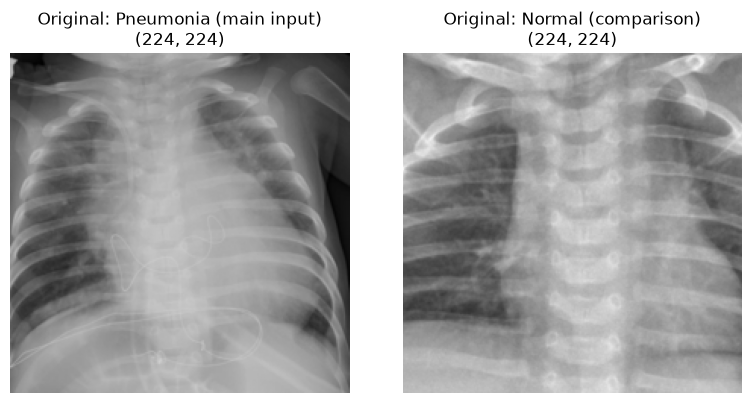


Step 1 verified: grayscale uint8 X-rays loaded


In [4]:
if not os.path.exists(DATA_PATH):
    os.makedirs("data", exist_ok=True)
    urllib.request.urlretrieve(DATA_URL, DATA_PATH)

ds = np.load(DATA_PATH)
test_x, test_y = ds["test_images"], ds["test_labels"].ravel()
LABELS = {0: "Normal", 1: "Pneumonia"}

xray_raw = test_x[np.where(test_y == 1)[0][0]]
normal_raw = test_x[np.where(test_y == 0)[0][0]]

print("test images :", test_x.shape, test_x.dtype)
print("class counts:", {LABELS[k]: int(v) for k, v in enumerate(np.bincount(test_y))})
print("chosen image:", xray_raw.shape, "range", xray_raw.min(), "-", xray_raw.max())

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
for ax, img, name in zip(axes, [xray_raw, normal_raw], ["Pneumonia (main input)", "Normal (comparison)"]):
    ax.imshow(img, cmap="gray", vmin=0, vmax=255)
    ax.set_title(f"Original: {name}\n{img.shape}")
    ax.axis("off")
plt.tight_layout()
plt.show()

# Verify: single-channel 8-bit images, so this really is grayscale.
assert xray_raw.ndim == 2 and xray_raw.dtype == np.uint8
print("\nStep 1 verified: grayscale uint8 X-rays loaded")

Observation

- The test split has 234 normal and 390 pneumonia X-rays, and the chosen pneumonia image spans intensities 1 to 207 out of 255.
- The pneumonia film has hazy white patches over both lower lungs, while the normal film has dark, clear lung fields between the ribs.

## Step 2: Pre-process: resize, normalise, convert to tensor

- Resizing 224 to 128 px cuts pixels by 3x, and lung opacity is a large pattern that survives the downsample.
- Dividing by 255 maps intensities to [0, 1], so filter outputs stay on a predictable scale.
- Keras wants a 4D tensor of batch, height, width, channels, so the image becomes (1, 128, 128, 1).

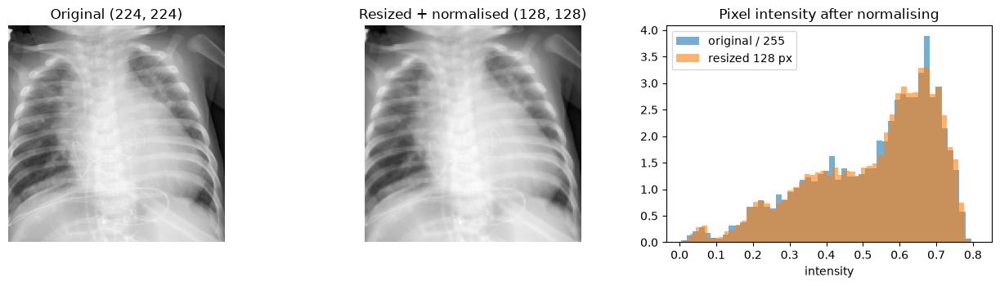

tensor shape: (1, 128, 128, 1) <dtype: 'float32'>
range       : 0.013 to 0.791
mean        : raw/255 0.5283  vs  resized 0.5283

Step 2 verified: (1, 128, 128, 1) float32 tensor in [0, 1]


In [5]:
def preprocess_gray(img_uint8, size=GRAY_SIZE):
    resized = transform.resize(img_uint8, (size, size), anti_aliasing=True, preserve_range=True)
    normalised = (resized / 255.0).astype("float32")
    tensor = tf.convert_to_tensor(normalised[None, :, :, None])
    return resized, normalised, tensor


xray_resized, xray, xray_tensor = preprocess_gray(xray_raw)
_, normal, normal_tensor = preprocess_gray(normal_raw)

fig, axes = plt.subplots(1, 3, figsize=(13, 3.6))
axes[0].imshow(xray_raw, cmap="gray"); axes[0].set_title(f"Original {xray_raw.shape}")
axes[1].imshow(xray, cmap="gray"); axes[1].set_title(f"Resized + normalised {xray.shape}")
for ax in axes[:2]:
    ax.axis("off")
axes[2].hist(xray_raw.ravel() / 255, bins=50, alpha=0.6, density=True, label="original / 255")
axes[2].hist(xray.ravel(), bins=50, alpha=0.6, density=True, label="resized 128 px")
axes[2].set_title("Pixel intensity after normalising")
axes[2].set_xlabel("intensity"); axes[2].legend()
plt.tight_layout()
plt.show()

print("tensor shape:", xray_tensor.shape, xray_tensor.dtype)
print(f"range       : {float(tf.reduce_min(xray_tensor)):.3f} to {float(tf.reduce_max(xray_tensor)):.3f}")
print(f"mean        : raw/255 {xray_raw.mean() / 255:.4f}  vs  resized {xray.mean():.4f}")

# Verify: 4D float32 tensor in [0, 1].
assert xray_tensor.shape == (1, GRAY_SIZE, GRAY_SIZE, 1) and xray_tensor.dtype == tf.float32
assert 0.0 <= float(tf.reduce_min(xray_tensor)) and float(tf.reduce_max(xray_tensor)) <= 1.0
print("\nStep 2 verified: (1, 128, 128, 1) float32 tensor in [0, 1]")

Observation

- Mean intensity is 0.5283 before and after the resize, so anti-aliased resizing kept the overall brightness.
- The two histograms almost overlap, and the ribs and heart outline are still readable at 128 px.
- The tensor runs from 0.013 to 0.791, inside the [0, 1] range the filters expect.

## Step 3: The user-defined filter bank (8 filters)

- All 8 kernels are copied from setosa.io/ev/image-kernels, so each has a known meaning before the CNN uses it.
- Blur and sharpen change smoothness, emboss and outline find relief and borders, and four Sobels find edges in each direction.
- Top and bottom Sobel are negatives of each other, and after ReLU each keeps only one edge polarity, so the pair is not redundant.

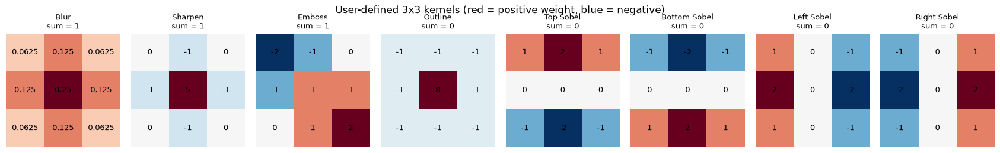

Layer                Filters    Size   Source
Conv1_UserDefined          8     3x3   hand-written kernels above, frozen
Conv2_BuiltIn             16     3x3   Keras Conv2D, Glorot-uniform init
Conv3_BuiltIn             32     3x3   Keras Conv2D, Glorot-uniform init

Step 3 verified: 8 kernels of shape (3, 3, 1, 8)


In [6]:
USER_KERNELS = {
    "Blur":         [[0.0625, 0.125, 0.0625], [0.125, 0.25, 0.125], [0.0625, 0.125, 0.0625]],
    "Sharpen":      [[0, -1, 0], [-1, 5, -1], [0, -1, 0]],
    "Emboss":       [[-2, -1, 0], [-1, 1, 1], [0, 1, 2]],
    "Outline":      [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]],
    "Top Sobel":    [[1, 2, 1], [0, 0, 0], [-1, -2, -1]],
    "Bottom Sobel": [[-1, -2, -1], [0, 0, 0], [1, 2, 1]],
    "Left Sobel":   [[1, 0, -1], [2, 0, -2], [1, 0, -1]],
    "Right Sobel":  [[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]],
}
K_NAMES = list(USER_KERNELS)
K1 = np.stack([np.array(k, dtype="float32") for k in USER_KERNELS.values()], axis=-1)[:, :, None, :]  # (3,3,1,8)

fig, axes = plt.subplots(1, 8, figsize=(17, 2.6))
for i, ax in enumerate(axes):
    k = K1[:, :, 0, i]
    lim = np.abs(k).max()
    ax.imshow(k, cmap="RdBu_r", vmin=-lim, vmax=lim)
    for (r, c), v in np.ndenumerate(k):
        ax.text(c, r, f"{v:g}", ha="center", va="center", fontsize=9)
    ax.set_title(f"{K_NAMES[i]}\nsum = {k.sum():g}", fontsize=9)
    ax.axis("off")
fig.suptitle("User-defined 3x3 kernels (red = positive weight, blue = negative)")
plt.tight_layout()
plt.show()

print(f"{'Layer':<20}{'Filters':>8}{'Size':>8}   Source")
for row in [("Conv1_UserDefined", 8, "3x3", "hand-written kernels above, frozen"),
            ("Conv2_BuiltIn", 16, "3x3", "Keras Conv2D, Glorot-uniform init"),
            ("Conv3_BuiltIn", 32, "3x3", "Keras Conv2D, Glorot-uniform init")]:
    print(f"{row[0]:<20}{row[1]:>8}{row[2]:>8}   {row[3]}")

# Verify: Bottom Sobel is exactly -Top Sobel, and the blur kernel sums to 1 so it keeps brightness.
assert np.array_equal(K1[..., 5], -K1[..., 4]) and np.isclose(K1[..., 0].sum(), 1.0)
print("\nStep 3 verified: 8 kernels of shape", K1.shape)

Observation

- Blur, sharpen and emboss sum to 1, so a flat region comes out at its own brightness.
- Outline and the four Sobels sum to 0, so a flat region gives 0 and only a change in intensity produces a response.
- Conv1 has 8 x 3 x 3 = 72 weights, and none of them is learned.

## Step 4: Convolution, ReLU and pooling, user-defined vs built-in

- The same 8 kernels run through my NumPy functions and through `tf.nn.conv2d`, `tf.nn.relu` and `tf.nn.max_pool2d`.
- The rows show the raw convolution, the map after ReLU, and the 64x64 map after 2x2 max pooling.

max |user - built-in|: {'conv': '0.00e+00', 'relu': '0.00e+00', 'pool': '0.00e+00'}


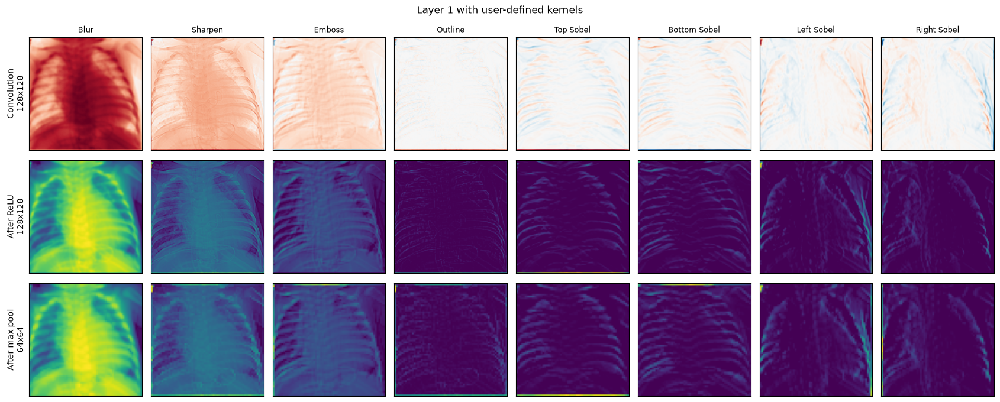

% pixels zeroed by ReLU: {'Blur': '0', 'Sharpen': '0', 'Emboss': '5', 'Outline': '50', 'Top Sobel': '56', 'Bottom Sobel': '44', 'Left Sobel': '46', 'Right Sobel': '54'}

Step 4 verified: user-defined and built-in outputs match


In [7]:
# User-defined path
u_conv = conv2d_user(xray[:, :, None], K1)
u_relu = relu_user(u_conv)
u_pool = maxpool_user(u_relu)

# Built-in path
b_conv = tf.nn.conv2d(xray_tensor, K1, strides=1, padding="SAME")
b_relu = tf.nn.relu(b_conv)
b_pool = tf.nn.max_pool2d(b_relu, ksize=2, strides=2, padding="VALID")

diffs = {name: float(np.abs(u - b.numpy()[0]).max())
         for name, u, b in [("conv", u_conv, b_conv), ("relu", u_relu, b_relu), ("pool", u_pool, b_pool)]}
print("max |user - built-in|:", {k: f"{v:.2e}" for k, v in diffs.items()})

fig, axes = plt.subplots(3, 8, figsize=(17, 7))
for i in range(8):
    lim = np.abs(u_conv[:, :, i]).max()
    axes[0, i].imshow(u_conv[:, :, i], cmap="RdBu_r", vmin=-lim, vmax=lim)
    axes[0, i].set_title(K_NAMES[i], fontsize=9)
    axes[1, i].imshow(u_relu[:, :, i], cmap="viridis")
    axes[2, i].imshow(u_pool[:, :, i], cmap="viridis")
for ax in axes.flat:
    ax.set_xticks([]); ax.set_yticks([])
for r, label in enumerate(["Convolution\n128x128", "After ReLU\n128x128", "After max pool\n64x64"]):
    axes[r, 0].set_ylabel(label)
plt.suptitle("Layer 1 with user-defined kernels")
plt.tight_layout()
plt.show()

zero_pct = [(u_relu[:, :, i] == 0).mean() * 100 for i in range(8)]
print("% pixels zeroed by ReLU:", {n: f"{z:.0f}" for n, z in zip(K_NAMES, zero_pct)})

# Verify: both paths agree to float32 rounding.
assert max(diffs.values()) < 1e-5
print("\nStep 4 verified: user-defined and built-in outputs match")

Observation

- The NumPy and TensorFlow paths differ by exactly 0.00e+00 for convolution, ReLU and pooling.
- ReLU zeroes 44 to 56% of pixels for outline and the Sobels, since every edge has a positive and a negative side, but 0% for blur and sharpen.
- Pooling halves the maps to 64x64 and keeps ribs and lung borders visible, and the bright lines on the frame come from zero padding, which creates a fake edge at the image border.

## Step 5: CNN architecture

- Three conv + pool blocks halve the map each time (128, 64, 32, 16) while channels grow from 8 to 16 to 32.
- Conv1 holds the 8 user-defined kernels and is frozen, and Conv2 and Conv3 are built-in `Conv2D` layers with Keras' Glorot init.
- Flatten turns 16x16x32 into 8,192 numbers, and a 64-unit Dense layer compresses them into the latent vector.

Model: "XrayCNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Xray (InputLayer)         │ (None, 128, 128, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv1_UserDefined (Conv2D)      │ (None, 128, 128, 8)    │            72 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool1 (MaxPooling2D)            │ (None, 64, 64, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2_BuiltIn (Conv2D)          │ (None, 64, 64, 16)     │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool2 (MaxPooling2D)            │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv3_BuiltIn (Conv2D)          │ (None, 32, 32, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool3 (MaxPooling2D)            │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Latent_64 (Dense)               │ (None, 64)             │       524,352 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 530,232 (2.02 MB)

 Trainable params: 530,160 (2.02 MB)

 Non-trainable params: 72 (288.00 B)

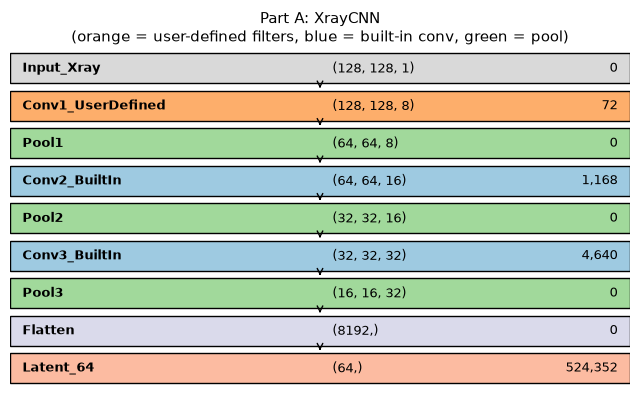

Step 5 verified: Conv1 = user-defined kernels (frozen), output = (None, 64)


In [8]:
def build_gray_cnn():
    L = tf.keras.layers
    inputs = tf.keras.Input((GRAY_SIZE, GRAY_SIZE, 1), name="Input_Xray")
    x = L.Conv2D(8, 3, padding="same", activation="relu", use_bias=False,
                 trainable=False, name="Conv1_UserDefined")(inputs)
    x = L.MaxPooling2D(2, name="Pool1")(x)
    x = L.Conv2D(16, 3, padding="same", activation="relu", name="Conv2_BuiltIn")(x)
    x = L.MaxPooling2D(2, name="Pool2")(x)
    x = L.Conv2D(32, 3, padding="same", activation="relu", name="Conv3_BuiltIn")(x)
    x = L.MaxPooling2D(2, name="Pool3")(x)
    x = L.Flatten(name="Flatten")(x)
    x = L.Dense(64, activation="relu", name="Latent_64")(x)
    model = tf.keras.Model(inputs, x, name="XrayCNN")
    model.get_layer("Conv1_UserDefined").set_weights([K1])
    return model


gray_cnn = build_gray_cnn()
gray_cnn.summary()
draw_architecture(gray_cnn, "Part A: XrayCNN", user_layers=("Conv1_UserDefined",))

# Verify: Conv1 holds exactly the user kernels and is frozen.
assert np.array_equal(gray_cnn.get_layer("Conv1_UserDefined").get_weights()[0], K1)
assert not gray_cnn.get_layer("Conv1_UserDefined").trainable
print("Step 5 verified: Conv1 = user-defined kernels (frozen), output =", gray_cnn.output.shape)

Observation

- The model has 530,232 parameters, and 524,352 of them (98.9%) are in the Dense layer joining 8,192 inputs to 64 units.
- Only Conv1's 72 weights are non-trainable, which confirms the user-defined layer is frozen while the built-in layers stay free to learn.

## Step 6: Built-in filters and the feature maps of every layer

- Conv2 has 16 filters that each read all 8 Conv1 maps, so it holds 16 x 8 = 128 separate 3x3 kernels, and Conv3 holds 32 x 16 = 512.
- A second Keras model returns every intermediate output, the same trick as the base notebook.
- Conv1's Keras output is checked against the NumPy pipeline from Step 4.

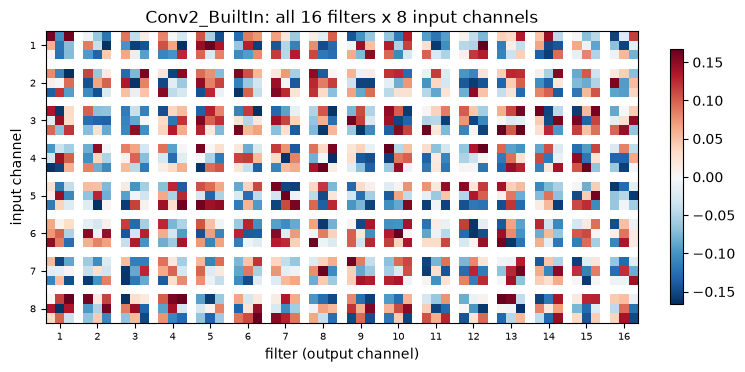

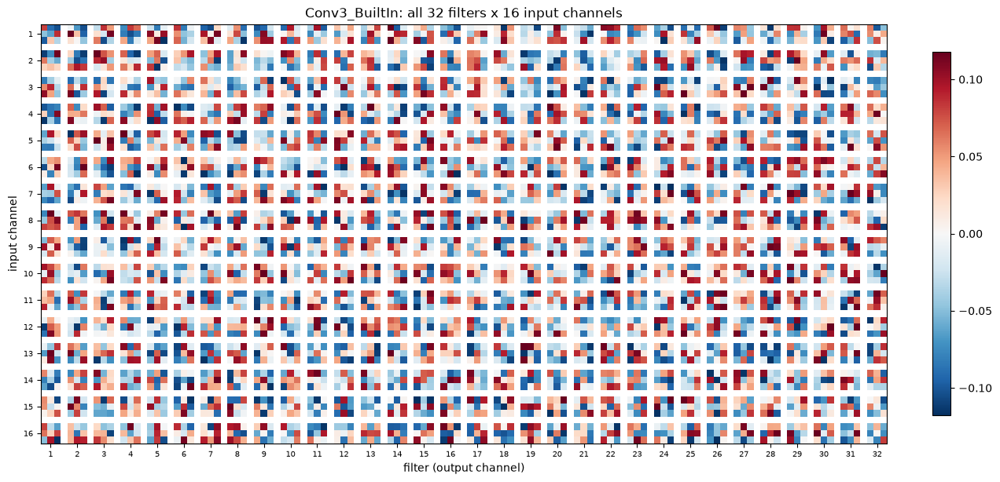

Conv1_UserDefined (128, 128, 8)    zero values  32.0%   dead channels 0
Pool1             (64, 64, 8)      zero values  19.2%   dead channels 0
Conv2_BuiltIn     (64, 64, 16)     zero values  57.9%   dead channels 1
Pool2             (32, 32, 16)     zero values  51.8%   dead channels 1
Conv3_BuiltIn     (32, 32, 32)     zero values  40.9%   dead channels 1
Pool3             (16, 16, 32)     zero values  31.7%   dead channels 1
Flatten           (8192,)          zero values  31.7%   dead channels -
Latent_64         (64,)            zero values  54.7%   dead channels -


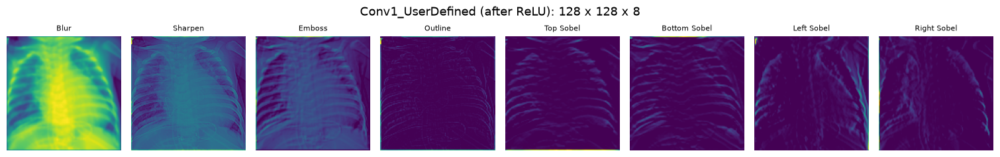

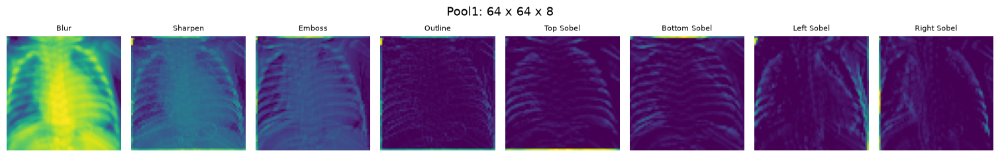

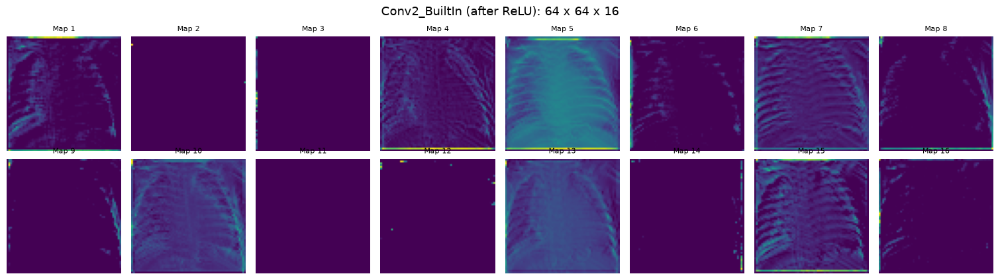

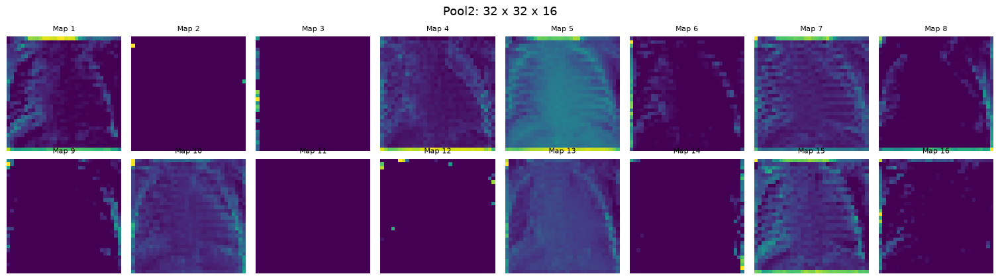

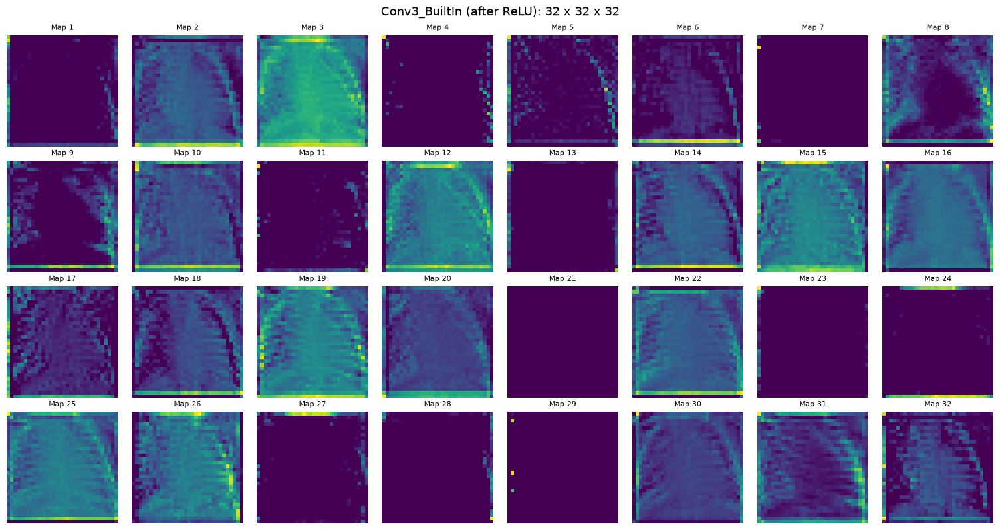

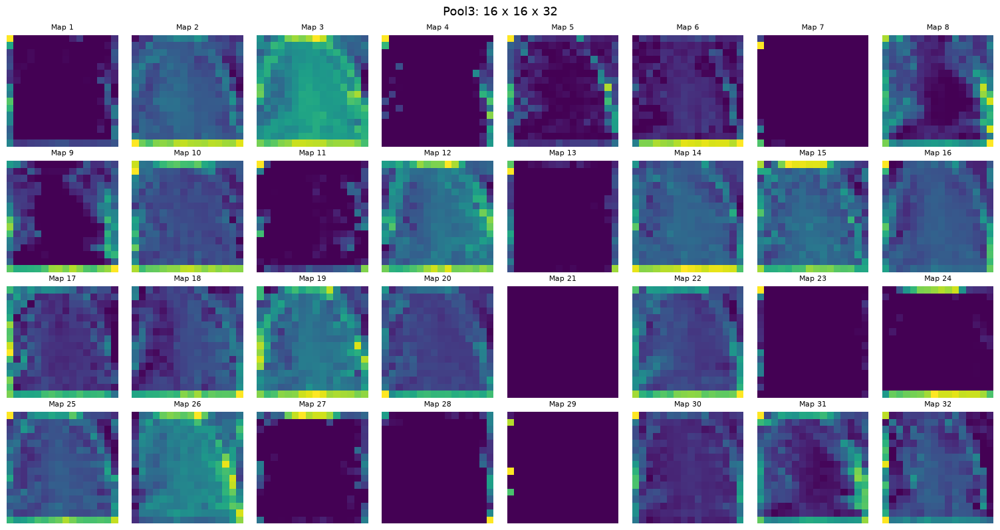


Step 6 verified: Keras Conv1/Pool1 = NumPy conv2d_user/maxpool_user


In [9]:
show_kernel_grid(gray_cnn.get_layer("Conv2_BuiltIn").get_weights()[0], "Conv2_BuiltIn: all 16 filters x 8 input channels")
show_kernel_grid(gray_cnn.get_layer("Conv3_BuiltIn").get_weights()[0], "Conv3_BuiltIn: all 32 filters x 16 input channels")

GRAY_LAYERS = ["Conv1_UserDefined", "Pool1", "Conv2_BuiltIn", "Pool2", "Conv3_BuiltIn", "Pool3", "Flatten", "Latent_64"]
gray_visual = tf.keras.Model(gray_cnn.input, [gray_cnn.get_layer(n).output for n in GRAY_LAYERS])


def gray_forward(tensor):
    return {n: o.numpy()[0] for n, o in zip(GRAY_LAYERS, gray_visual(tensor, training=False))}


acts = gray_forward(xray_tensor)
for n in GRAY_LAYERS:
    a = acts[n]
    dead = int((a.reshape(-1, a.shape[-1]).max(axis=0) == 0).sum()) if a.ndim == 3 else "-"
    print(f"{n:<18}{str(a.shape):<16} zero values {np.mean(a == 0) * 100:5.1f}%   dead channels {dead}")

show_maps(acts["Conv1_UserDefined"], "Conv1_UserDefined (after ReLU): 128 x 128 x 8", names=K_NAMES)
show_maps(acts["Pool1"], "Pool1: 64 x 64 x 8", names=K_NAMES)
show_maps(acts["Conv2_BuiltIn"], "Conv2_BuiltIn (after ReLU): 64 x 64 x 16")
show_maps(acts["Pool2"], "Pool2: 32 x 32 x 16")
show_maps(acts["Conv3_BuiltIn"], "Conv3_BuiltIn (after ReLU): 32 x 32 x 32")
show_maps(acts["Pool3"], "Pool3: 16 x 16 x 32")

# Verify: the Keras layer reproduces the NumPy pipeline.
assert np.abs(acts["Conv1_UserDefined"] - u_relu).max() < 1e-5 and np.abs(acts["Pool1"] - u_pool).max() < 1e-5
print("\nStep 6 verified: Keras Conv1/Pool1 = NumPy conv2d_user/maxpool_user")

Observation

- The built-in kernels look like noise within about plus or minus 0.17, since Glorot init draws them at random and no training has shaped them.
- Conv2 and Conv3 maps still show ribs and lung borders, because they are random mixtures of the 8 structured Conv1 maps.
- Conv2 map 11 and Conv3 map 21 are zero everywhere, and Conv3 maps 7 and 29 are non-zero on under 1% of pixels, the usual cost of random weights followed by ReLU.

## Step 7: Flatten and the 64-D latent vector

- Flatten only reorders Pool3 into one row, so it has the same 8,192 values and no new information.
- The Dense layer mixes all 8,192 values into 64, and that vector is the latent representation of the X-ray.
- A normal X-ray goes through the same network to see how far apart the two latent vectors land.

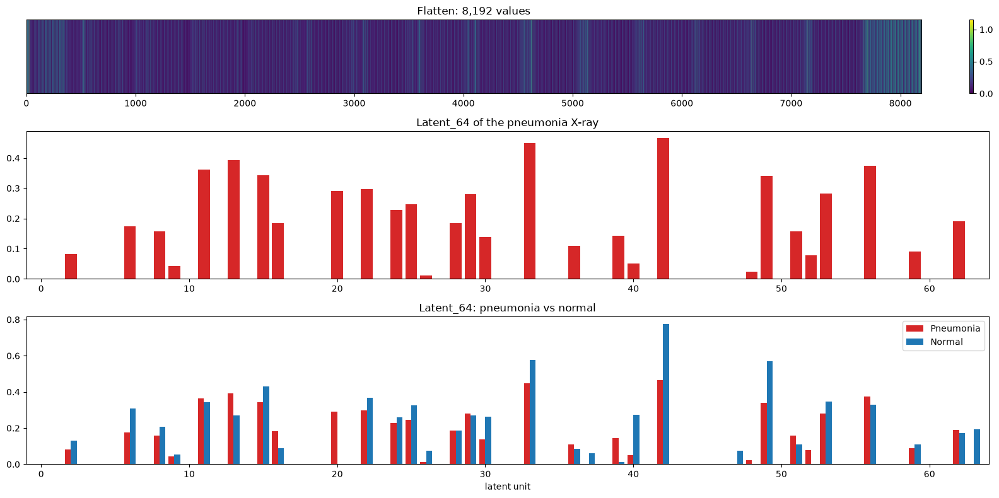

latent (pneumonia):
 [0.    0.    0.081 0.    0.    0.    0.174 0.    0.158 0.042 0.    0.363
 0.    0.393 0.    0.344 0.184 0.    0.    0.    0.291 0.    0.296 0.
 0.228 0.247 0.012 0.    0.185 0.281 0.138 0.    0.    0.448 0.    0.
 0.11  0.    0.    0.143 0.051 0.    0.465 0.    0.    0.    0.    0.
 0.023 0.34  0.    0.157 0.077 0.282 0.    0.    0.375 0.    0.    0.09
 0.    0.    0.19  0.   ]

non-zero units : pneumonia 29/64, normal 29/64
cosine similarity pneumonia vs normal: 0.915
compression    : 16,384 pixels -> 64 numbers (256x)

Step 7 verified: Flatten = reshaped Pool3, latent saved to outputs/xray_latent_64.csv


In [10]:
flat, latent = acts["Flatten"], acts["Latent_64"]
latent_normal = gray_forward(normal_tensor)["Latent_64"]

fig, axes = plt.subplots(3, 1, figsize=(16, 8), gridspec_kw={"height_ratios": [1, 2, 2]})
im = axes[0].imshow(flat.reshape(1, -1), aspect="auto", cmap="viridis")
axes[0].set_title(f"Flatten: {flat.size:,} values"); axes[0].set_yticks([])
plt.colorbar(im, ax=axes[0], fraction=0.02)
axes[1].bar(np.arange(64), latent, color="tab:red")
axes[1].set_title("Latent_64 of the pneumonia X-ray"); axes[1].set_xlim(-1, 64)
axes[2].bar(np.arange(64) - 0.2, latent, 0.4, label="Pneumonia", color="tab:red")
axes[2].bar(np.arange(64) + 0.2, latent_normal, 0.4, label="Normal", color="tab:blue")
axes[2].set_title("Latent_64: pneumonia vs normal"); axes[2].set_xlabel("latent unit")
axes[2].legend(); axes[2].set_xlim(-1, 64)
plt.tight_layout()
plt.show()

cos = float(latent @ latent_normal / (np.linalg.norm(latent) * np.linalg.norm(latent_normal)))
print("latent (pneumonia):\n", np.round(latent, 3))
print(f"\nnon-zero units : pneumonia {np.count_nonzero(latent)}/64, normal {np.count_nonzero(latent_normal)}/64")
print(f"cosine similarity pneumonia vs normal: {cos:.3f}")
print(f"compression    : {GRAY_SIZE * GRAY_SIZE:,} pixels -> {latent.size} numbers ({GRAY_SIZE * GRAY_SIZE // latent.size}x)")
np.savetxt("outputs/xray_latent_64.csv", latent.reshape(1, -1), delimiter=",")

# Verify: Flatten is a pure reshape of Pool3, and the latent is repeatable.
assert np.array_equal(flat, acts["Pool3"].reshape(-1))
assert np.allclose(gray_forward(xray_tensor)["Latent_64"], latent)
print("\nStep 7 verified: Flatten = reshaped Pool3, latent saved to outputs/xray_latent_64.csv")

Observation

- 16,384 pixels became 64 numbers, a 256x reduction, and ReLU left 29 of the 64 units non-zero for both X-rays.
- The pneumonia and normal latents have cosine similarity 0.915, so this network places two different diagnoses close together.
- Every layer after Conv1 is random, so the latent encodes image structure rather than disease, and training on the labels is what would pull the classes apart.

## Step 8: A second modality: breast ultrasound

- BreastMNIST is 780 breast ultrasound images at 224x224 grayscale, labelled malignant or normal/benign.
- Ultrasound is built from sound echoes, so it has grainy speckle and soft borders where an X-ray has sharp bone edges, which tests whether the same filters still find structure.
- It goes through the same `preprocess_gray` as the X-ray, so any difference later comes from the image and not the pipeline.

test images : (156, 224, 224) uint8
class counts: {'Malignant': 42, 'Normal/benign': 114}
mean intensity: X-ray 0.528, ultrasound 0.204


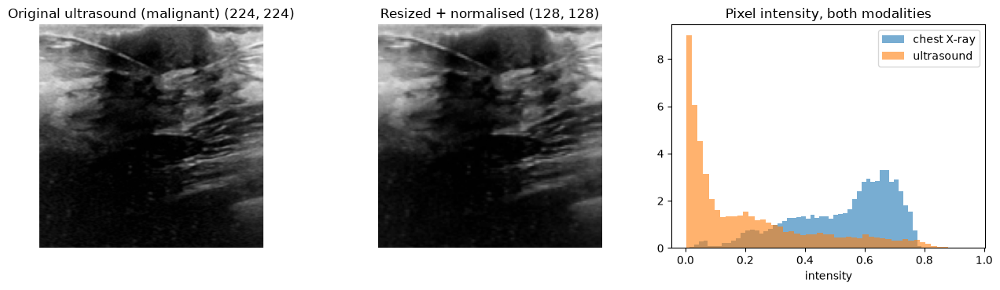


Step 8 verified: ultrasound tensor (1, 128, 128, 1) matches the X-ray format


In [11]:
US_URL = "https://zenodo.org/records/10519652/files/breastmnist_224.npz?download=1"
US_PATH = "data/breastmnist_224.npz"
if not os.path.exists(US_PATH):
    urllib.request.urlretrieve(US_URL, US_PATH)

us_ds = np.load(US_PATH)
us_x, us_y = us_ds["test_images"], us_ds["test_labels"].ravel()
US_LABELS = {0: "Malignant", 1: "Normal/benign"}
us_raw = us_x[np.where(us_y == 0)[0][0]]
_, us_img, us_tensor = preprocess_gray(us_raw)

print("test images :", us_x.shape, us_x.dtype)
print("class counts:", {US_LABELS[k]: int(v) for k, v in enumerate(np.bincount(us_y))})
print(f"mean intensity: X-ray {xray.mean():.3f}, ultrasound {us_img.mean():.3f}")

fig, axes = plt.subplots(1, 3, figsize=(13, 3.8))
axes[0].imshow(us_raw, cmap="gray", vmin=0, vmax=255); axes[0].set_title(f"Original ultrasound (malignant) {us_raw.shape}")
axes[1].imshow(us_img, cmap="gray", vmin=0, vmax=1); axes[1].set_title(f"Resized + normalised {us_img.shape}")
for ax in axes[:2]:
    ax.axis("off")
axes[2].hist(xray.ravel(), bins=50, alpha=0.6, density=True, label="chest X-ray")
axes[2].hist(us_img.ravel(), bins=50, alpha=0.6, density=True, label="ultrasound")
axes[2].set_title("Pixel intensity, both modalities"); axes[2].set_xlabel("intensity"); axes[2].legend()
plt.tight_layout()
plt.show()

# Verify: same tensor format as the X-ray, so the same network accepts it.
assert us_raw.ndim == 2 and us_tensor.shape == xray_tensor.shape and us_tensor.dtype == tf.float32
print("\nStep 8 verified: ultrasound tensor", us_tensor.shape, "matches the X-ray format")

Observation

- The test split has 42 malignant and 114 normal/benign ultrasounds, and the chosen image is malignant.
- Mean intensity is 0.204 against the X-ray's 0.528, and the histogram piles up near 0 because most of the frame is tissue that sends back no echo.
- The image shows streaky speckle and blurred tissue layers instead of the X-ray's clean rib edges.

## Step 9: Same CNN, X-ray vs ultrasound

- The 8 user-defined Conv1 filters run on both images side by side, so one filter's behaviour can be compared across modalities.
- The grid shows the ultrasound's top 8 channels after every conv and pool layer, the same view Part B uses for VGG16.
- The latent vectors of the pneumonia X-ray, the normal X-ray and the ultrasound are compared with cosine similarity.

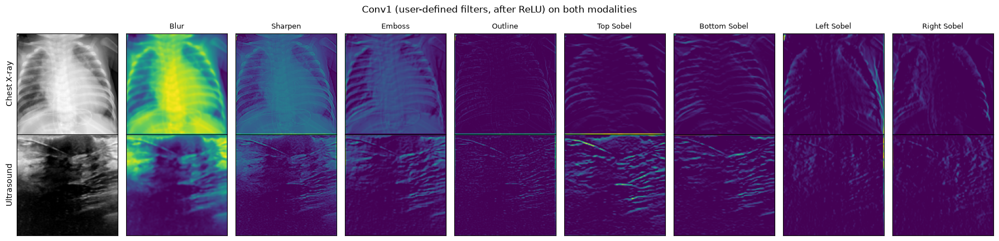

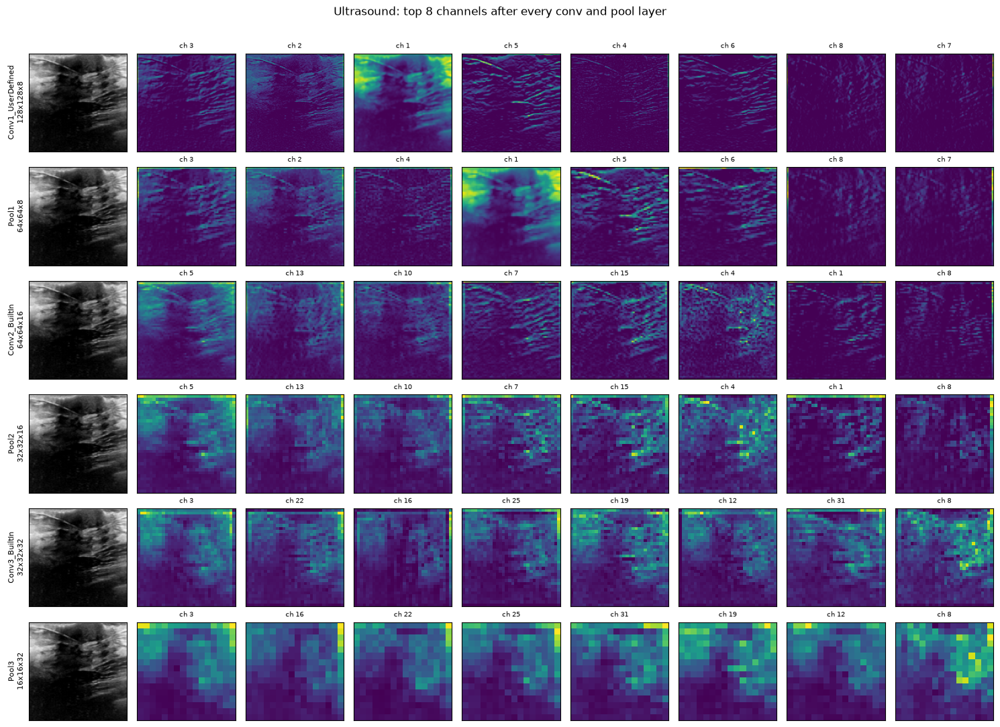

Conv1 filter   mean X-ray   mean US
Blur               0.5251    0.2013
Sharpen            0.5415    0.2224
Emboss             0.5485    0.2376
Outline            0.0777    0.1153
Top Sobel          0.0706    0.1240
Bottom Sobel       0.0795    0.1048
Left Sobel         0.0711    0.0664
Right Sobel        0.0631    0.0693

Layer              % zero X-ray  % zero US
Conv1_UserDefined         32.0%      37.4%
Pool1                     19.2%      15.9%
Conv2_BuiltIn             57.9%      56.3%
Pool2                     51.8%      42.8%
Conv3_BuiltIn             40.9%      42.5%
Pool3                     31.7%      27.1%
Flatten                   31.7%      27.1%
Latent_64                 54.7%      53.1%


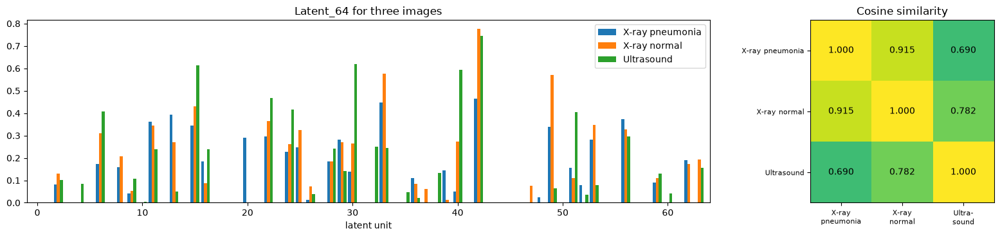


non-zero latent units: ultrasound 30/64
cosine similarity:
  X-ray pneumonia    1.000   0.915   0.690
  X-ray normal       0.915   1.000   0.782
  Ultrasound         0.690   0.782   1.000

Step 9 verified: user-defined pipeline matches Keras on the ultrasound, latent saved to outputs/ultrasound_latent_64.csv


In [12]:
us_acts = gray_forward(us_tensor)

fig, axes = plt.subplots(2, 9, figsize=(18, 4.4))
for r, (name, img, a) in enumerate([("Chest X-ray", xray, acts), ("Ultrasound", us_img, us_acts)]):
    axes[r, 0].imshow(img, cmap="gray"); axes[r, 0].set_ylabel(name)
    for i in range(8):
        axes[r, i + 1].imshow(a["Conv1_UserDefined"][:, :, i], cmap="viridis")
        if r == 0:
            axes[r, i + 1].set_title(K_NAMES[i], fontsize=9)
for ax in axes.flat:
    ax.set_xticks([]); ax.set_yticks([])
plt.suptitle("Conv1 (user-defined filters, after ReLU) on both modalities")
plt.tight_layout()
plt.show()

conv_pool = GRAY_LAYERS[:6]
fig, axes = plt.subplots(len(conv_pool), 9, figsize=(15, 1.8 * len(conv_pool)))
for r, n in enumerate(conv_pool):
    fmap = us_acts[n]
    axes[r, 0].imshow(us_img, cmap="gray")
    axes[r, 0].set_ylabel(f"{n}\n{fmap.shape[0]}x{fmap.shape[1]}x{fmap.shape[2]}", fontsize=8)
    for c, ch in enumerate(np.argsort(fmap.mean(axis=(0, 1)))[::-1][:8]):
        axes[r, c + 1].imshow(fmap[:, :, ch], cmap="viridis")
        axes[r, c + 1].set_title(f"ch {ch + 1}", fontsize=7)
for ax in axes.flat:
    ax.set_xticks([]); ax.set_yticks([])
plt.suptitle("Ultrasound: top 8 channels after every conv and pool layer", y=1.0)
plt.tight_layout(rect=(0, 0, 1, 0.99))
plt.show()

print(f"{'Conv1 filter':<14}{'mean X-ray':>11}{'mean US':>10}")
for i, n in enumerate(K_NAMES):
    print(f"{n:<14}{acts['Conv1_UserDefined'][:, :, i].mean():>11.4f}{us_acts['Conv1_UserDefined'][:, :, i].mean():>10.4f}")
print(f"\n{'Layer':<18}{'% zero X-ray':>13}{'% zero US':>11}")
for n in GRAY_LAYERS:
    print(f"{n:<18}{np.mean(acts[n] == 0) * 100:>12.1f}%{np.mean(us_acts[n] == 0) * 100:>10.1f}%")

latent_us = us_acts["Latent_64"]
vecs = {"X-ray pneumonia": latent, "X-ray normal": latent_normal, "Ultrasound": latent_us}
names = list(vecs)
sim = np.array([[vecs[a] @ vecs[b] / (np.linalg.norm(vecs[a]) * np.linalg.norm(vecs[b])) for b in names] for a in names])

fig, axes = plt.subplots(1, 2, figsize=(16, 3.8), gridspec_kw={"width_ratios": [3, 1]})
for j, (n, v) in enumerate(vecs.items()):
    axes[0].bar(np.arange(64) + (j - 1) * 0.28, v, 0.28, label=n)
axes[0].set_title("Latent_64 for three images"); axes[0].set_xlabel("latent unit"); axes[0].legend(); axes[0].set_xlim(-1, 64)
im = axes[1].imshow(sim, cmap="viridis", vmin=0, vmax=1)
axes[1].set_xticks(range(3), ["X-ray\npneumonia", "X-ray\nnormal", "Ultra-\nsound"], fontsize=8)
axes[1].set_yticks(range(3), ["X-ray pneumonia", "X-ray normal", "Ultrasound"], fontsize=8)
for (r, c), v in np.ndenumerate(sim):
    axes[1].text(c, r, f"{v:.3f}", ha="center", va="center", color="white" if v < 0.6 else "black")
axes[1].set_title("Cosine similarity")
plt.tight_layout()
plt.show()

print(f"\nnon-zero latent units: ultrasound {np.count_nonzero(latent_us)}/64")
print("cosine similarity:")
for n, row in zip(names, sim):
    print(f"  {n:<16}" + "".join(f"{v:>8.3f}" for v in row))
np.savetxt("outputs/ultrasound_latent_64.csv", latent_us.reshape(1, -1), delimiter=",")

# Verify: the NumPy pipeline reproduces Conv1 + Pool1 on this image too.
assert np.abs(maxpool_user(relu_user(conv2d_user(us_img[:, :, None], K1))) - us_acts["Pool1"]).max() < 1e-5
print("\nStep 9 verified: user-defined pipeline matches Keras on the ultrasound, latent saved to outputs/ultrasound_latent_64.csv")

Observation

- The ultrasound is darker, yet outline and top Sobel respond more strongly on it (0.1153 vs 0.0777 and 0.1240 vs 0.0706), because speckle is full of small intensity jumps.
- Blur, sharpen and emboss track brightness and fall to 0.20 to 0.24, while the left and right Sobels barely move, since the tissue layers here run mostly horizontally.
- The ultrasound's latent has cosine similarity 0.690 with the pneumonia X-ray and 0.782 with the normal one, below the 0.915 between the two X-rays, so even random deeper layers separate the two imaging types more than the two diagnoses.

# Part B: RGB image (cat)

## Step 10: RGB pre-processing

- Chelsea the cat ships with scikit-image, the same image as the base notebook, so no download is needed.
- A centre crop to a square before resizing to 224x224 keeps the cat's proportions, which a straight resize of 300x451 would squash.
- User-defined filters get [0, 1] RGB, and VGG16 gets its own built-in `preprocess_input` (RGB to BGR, ImageNet mean subtracted), the input it was trained on.

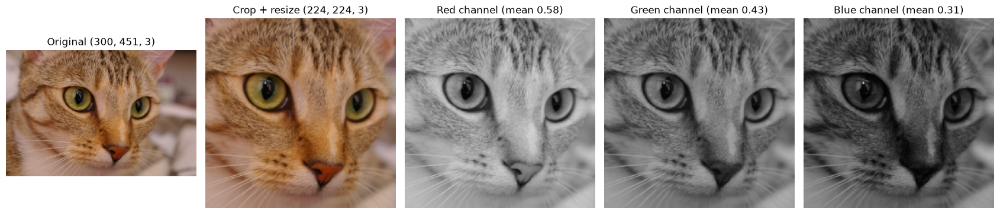

user-defined input: (224, 224, 3) range 0.00 to 0.88
VGG16 input tensor: (1, 224, 224, 3) range -119.5 to 121.0

Step 10 verified: 224x224x3 input, BGR mean-subtracted for VGG16


In [13]:
def preprocess_rgb(img_uint8, size=RGB_SIZE, zoom=1.0):
    h, w, _ = img_uint8.shape
    side = int(min(h, w) * zoom)
    top, left = (h - side) // 2, (w - side) // 2
    crop = img_uint8[top: top + side, left: left + side]
    return transform.resize(crop, (size, size), anti_aliasing=True).astype("float32")  # [0, 1]


def to_vgg_tensor(img01):
    return tf.convert_to_tensor(tf.keras.applications.vgg16.preprocess_input(img01[None] * 255.0))


cat_raw = data.chelsea()
cat = preprocess_rgb(cat_raw)
cat_tensor = to_vgg_tensor(cat)

fig, axes = plt.subplots(1, 5, figsize=(17, 3.6))
axes[0].imshow(cat_raw); axes[0].set_title(f"Original {cat_raw.shape}")
axes[1].imshow(cat); axes[1].set_title(f"Crop + resize {cat.shape}")
for i, name in enumerate(["Red", "Green", "Blue"]):
    axes[i + 2].imshow(cat[:, :, i], cmap="gray", vmin=0, vmax=1)
    axes[i + 2].set_title(f"{name} channel (mean {cat[:, :, i].mean():.2f})")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

vgg_in = cat_tensor.numpy()[0]
print("user-defined input:", cat.shape, f"range {cat.min():.2f} to {cat.max():.2f}")
print("VGG16 input tensor:", cat_tensor.shape, f"range {vgg_in.min():.1f} to {vgg_in.max():.1f}")

# Verify: channel 0 of the VGG tensor is blue minus the ImageNet blue mean (103.939).
assert np.allclose(vgg_in[..., 0], cat[..., 2] * 255 - 103.939, atol=1e-3)
print("\nStep 10 verified: 224x224x3 input, BGR mean-subtracted for VGG16")

Observation

- The centre crop turns 300x451 into 300x300 before resizing, so the face keeps its proportions.
- Channel means are 0.58 red, 0.43 green and 0.31 blue, which fits the orange-brown fur.
- The VGG tensor runs from -119.5 to 121.0 after mean subtraction, the scale its ImageNet weights were trained on.

## Step 11: User-defined RGB filters for edges, textures and shapes (8 filters)

- Edges use Sobel x and y (3x3), textures use Gabor filters at 0, 45, 90 and 135 degrees (9x9), and shapes use Mexican-hat blob detectors at two sizes (13x13 and 31x31).
- Each 2D kernel is copied across R, G and B with luminance weights 0.299, 0.587 and 0.114, so it sees brightness structure and ignores colour.
- There is no hand-written kernel for semantic features, since nobody can write down "cat" as a grid of numbers, which is why Step 12 needs learned filters.

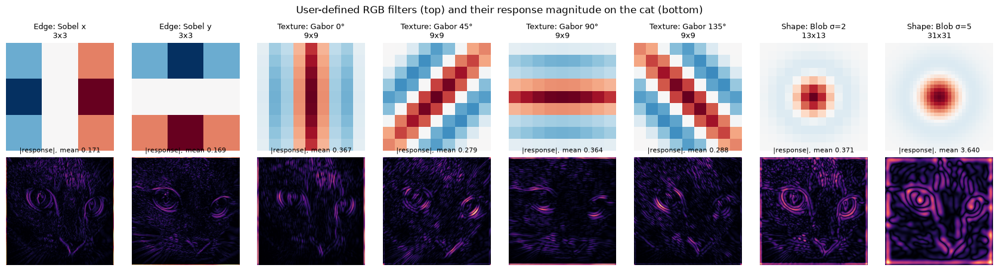

max |user - built-in| over all 8 filters: 4.86e-05

Step 11 verified: 8 user-defined RGB filters, user-defined and built-in conv agree


In [14]:
LUMA = np.array([0.299, 0.587, 0.114], dtype="float32")


def gabor(theta, size=9, sigma=2.5, lam=6.0, gamma=0.5):
    r = size // 2
    y, x = np.mgrid[-r: r + 1, -r: r + 1]
    xr = x * np.cos(theta) + y * np.sin(theta)
    yr = -x * np.sin(theta) + y * np.cos(theta)
    g = np.exp(-(xr ** 2 + (gamma * yr) ** 2) / (2 * sigma ** 2)) * np.cos(2 * np.pi * xr / lam)
    return g - g.mean()  # zero sum: flat regions give 0


def mexican_hat(sigma):
    r = int(3 * sigma)
    y, x = np.mgrid[-r: r + 1, -r: r + 1]
    r2 = (x ** 2 + y ** 2) / (2 * sigma ** 2)
    g = (1 - r2) * np.exp(-r2)  # negative Laplacian of Gaussian: bright blob of width ~sigma -> peak
    return g - g.mean()


RGB_FILTERS = {  # name: (feature level, 2D kernel)
    "Sobel x":      ("Edge", np.array(USER_KERNELS["Right Sobel"], dtype=float)),
    "Sobel y":      ("Edge", np.array(USER_KERNELS["Bottom Sobel"], dtype=float)),
    "Gabor 0°":     ("Texture", gabor(0)),
    "Gabor 45°":    ("Texture", gabor(np.pi / 4)),
    "Gabor 90°":    ("Texture", gabor(np.pi / 2)),
    "Gabor 135°":   ("Texture", gabor(3 * np.pi / 4)),
    "Blob σ=2":     ("Shape", mexican_hat(2)),
    "Blob σ=5":     ("Shape", mexican_hat(5)),
}

fig, axes = plt.subplots(2, 8, figsize=(17, 4.6))
responses = {}
max_diff = 0.0
for i, (name, (level, k2d)) in enumerate(RGB_FILTERS.items()):
    k_rgb = (k2d[:, :, None] * LUMA[None, None, :])[..., None].astype("float32")  # (k, k, 3, 1)
    user = conv2d_user(cat, k_rgb)[:, :, 0]
    builtin = tf.nn.conv2d(cat[None], k_rgb, strides=1, padding="SAME").numpy()[0, :, :, 0]
    max_diff = max(max_diff, float(np.abs(user - builtin).max()))
    responses[name] = np.abs(user)
    lim = np.abs(k2d).max()
    axes[0, i].imshow(k2d, cmap="RdBu_r", vmin=-lim, vmax=lim)
    axes[0, i].set_title(f"{level}: {name}\n{k2d.shape[0]}x{k2d.shape[1]}", fontsize=9)
    axes[1, i].imshow(responses[name], cmap="magma")
    axes[1, i].set_title(f"|response|, mean {responses[name].mean():.3f}", fontsize=8)
for ax in axes.flat:
    ax.axis("off")
plt.suptitle("User-defined RGB filters (top) and their response magnitude on the cat (bottom)")
plt.tight_layout()
plt.show()

print(f"max |user - built-in| over all 8 filters: {max_diff:.2e}")

# Verify: the NumPy convolution matches tf.nn.conv2d for every filter size, 3x3 up to 31x31.
assert max_diff < 1e-4
print("\nStep 11 verified: 8 user-defined RGB filters, user-defined and built-in conv agree")

Observation

- NumPy and TensorFlow agree to 4.86e-05 for every filter, from 3x3 up to 31x31.
- Sobel x picks out vertical boundaries such as the sides of the eyes and nose, and each Gabor picks out fur stripes and whiskers at its own angle.
- The 13x13 blob outlines the eyes and nose, while the 31x31 blob traces large regions and shows the strongest zero-padding artefact at the border.

## Step 12: Built-in CNN: pretrained VGG16

- VGG16 has 13 conv layers (3x3, ReLU) in 5 blocks with a 2x2 max pool after each block, and ImageNet training learned all 4,224 filters.
- The ImageNet classifier head is dropped, and global average pooling turns the final 7x7x512 block into a 512-D latent vector, the input a classifier would read.
- The first layer's 64 RGB filters are the only ones that can be drawn as images, and they are run through `conv2d_user` as a final check.

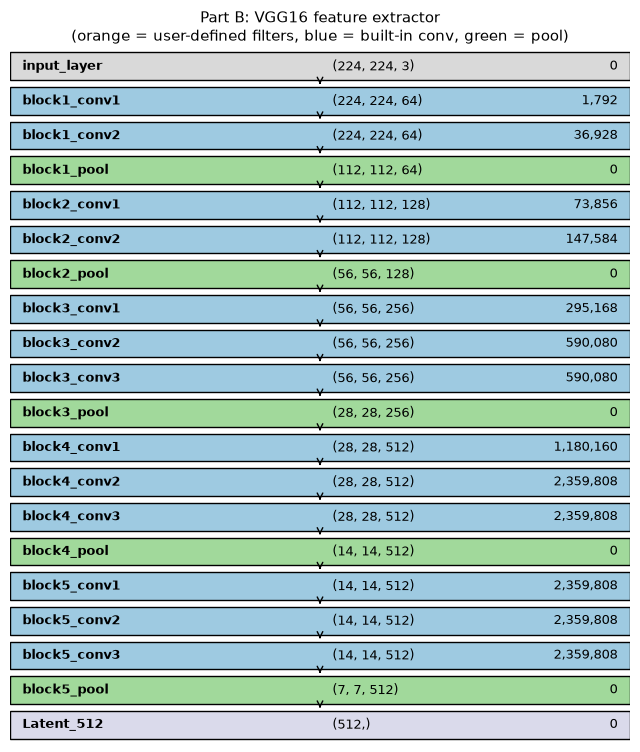

Layer            Filters    Kernel      Params
block1_conv1          64    (3, 3)       1,792
block1_conv2          64    (3, 3)      36,928
block2_conv1         128    (3, 3)      73,856
block2_conv2         128    (3, 3)     147,584
block3_conv1         256    (3, 3)     295,168
block3_conv2         256    (3, 3)     590,080
block3_conv3         256    (3, 3)     590,080
block4_conv1         512    (3, 3)   1,180,160
block4_conv2         512    (3, 3)   2,359,808
block4_conv3         512    (3, 3)   2,359,808
block5_conv1         512    (3, 3)   2,359,808
block5_conv2         512    (3, 3)   2,359,808
block5_conv3         512    (3, 3)   2,359,808
total learned filters: 4,224   total params: 14,714,688


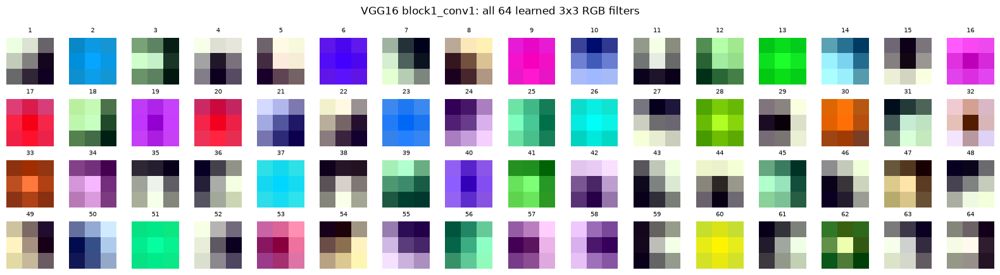

block1_conv1 user-defined vs Keras: max relative error 1.57e-07

Step 12 verified: 13 conv layers, 4,224 filters, user-defined conv reproduces block1_conv1


In [15]:
L = tf.keras.layers
vgg = tf.keras.applications.VGG16(weights="imagenet", include_top=False, input_shape=(RGB_SIZE, RGB_SIZE, 3))
latent_out = L.GlobalAveragePooling2D(name="Latent_512")(vgg.output)
rgb_cnn = tf.keras.Model(vgg.input, latent_out, name="VGG16_features")
draw_architecture(rgb_cnn, "Part B: VGG16 feature extractor")

conv_layers = [l for l in vgg.layers if isinstance(l, L.Conv2D)]
pool_layers = [l for l in vgg.layers if isinstance(l, L.MaxPooling2D)]
print(f"{'Layer':<16}{'Filters':>8}{'Kernel':>10}{'Params':>12}")
for l in conv_layers:
    print(f"{l.name:<16}{l.filters:>8}{str(l.kernel_size):>10}{l.count_params():>12,}")
print(f"total learned filters: {sum(l.filters for l in conv_layers):,}   total params: {rgb_cnn.count_params():,}")

W1, b1 = vgg.get_layer("block1_conv1").get_weights()  # (3, 3, 3, 64), input order BGR
tiles = W1[:, :, ::-1, :]  # BGR -> RGB for display
tiles = (tiles - tiles.min(axis=(0, 1, 2))) / np.ptp(tiles, axis=(0, 1, 2))
fig, axes = plt.subplots(4, 16, figsize=(16, 4.4))
for i, ax in enumerate(axes.flat):
    ax.imshow(tiles[:, :, :, i]); ax.set_title(str(i + 1), fontsize=7); ax.axis("off")
plt.suptitle("VGG16 block1_conv1: all 64 learned 3x3 RGB filters")
plt.tight_layout()
plt.show()

RGB_LAYERS = [l.name for l in conv_layers + pool_layers]
rgb_visual = tf.keras.Model(vgg.input, [vgg.get_layer(n).output for n in RGB_LAYERS]
                            + [L.Flatten()(vgg.output), latent_out])


def rgb_forward(tensor):
    outs = [o.numpy()[0] for o in rgb_visual(tensor, training=False)]
    return dict(zip(RGB_LAYERS + ["Flatten", "Latent_512"], outs))


ract = rgb_forward(cat_tensor)
user_b1 = relu_user(conv2d_user(vgg_in, W1, b1))
rel_err = np.abs(user_b1 - ract["block1_conv1"]).max() / ract["block1_conv1"].max()
print(f"block1_conv1 user-defined vs Keras: max relative error {rel_err:.2e}")

# Verify: my convolution with VGG's learned weights reproduces VGG's own first layer.
assert rel_err < 1e-5
print("\nStep 12 verified: 13 conv layers, 4,224 filters, user-defined conv reproduces block1_conv1")

Observation

- The 13 conv layers hold 4,224 filters and 14,714,688 parameters, and blocks 4 and 5 alone carry 88.2% of them.
- Filters 2, 13, 20 and 30 are flat blue, green, red and orange, while filters such as 1, 3 and 27 are light-dark edge detectors, so VGG learned colour filters that my brightness-only kernels do not have.
- `conv2d_user` with VGG's own weights and biases reproduces block1_conv1 to a relative error of 1.57e-07.

## Step 13: Output channels after every convolution and pooling layer

- VGG16 has 64 to 512 channels per layer, so each row shows the 8 channels with the highest mean activation, which are the ones reacting most to this cat.
- Each tile is scaled on its own so weak and strong channels are both visible.

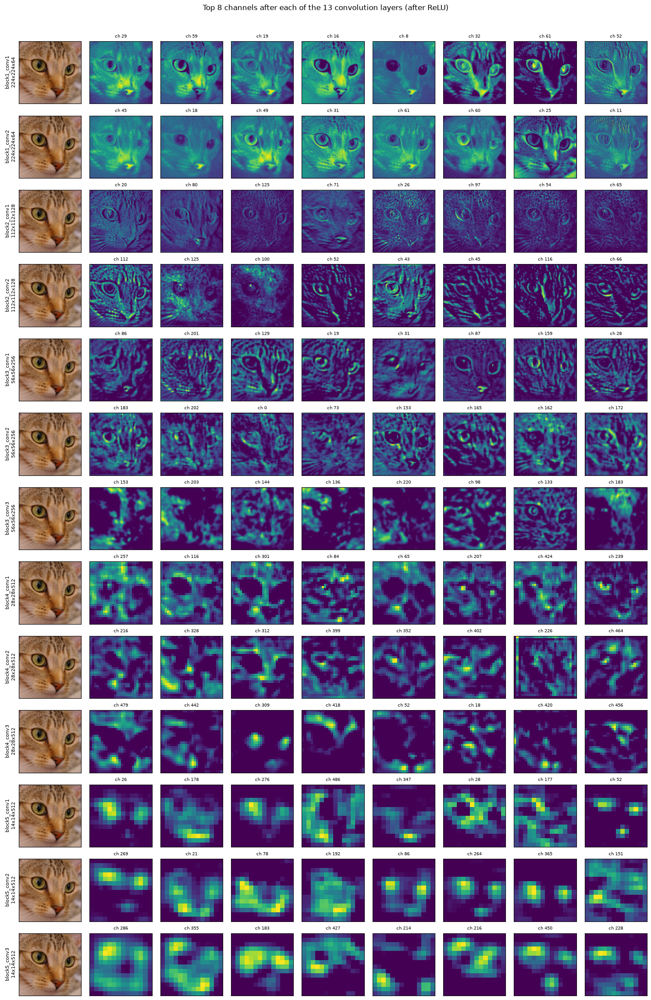

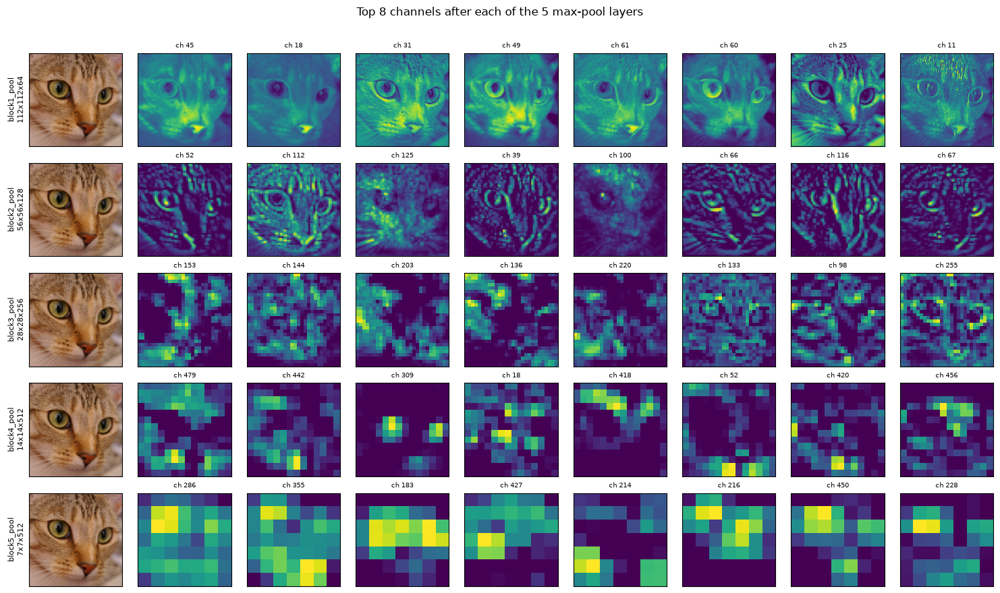

Layer         Shape               % zero  dead ch
block1_conv1  (224, 224, 64)       53.0%        0
block1_conv2  (224, 224, 64)       32.8%        0
block2_conv1  (112, 112, 128)      36.0%        1
block2_conv2  (112, 112, 128)      51.7%        0
block3_conv1  (56, 56, 256)        49.5%        0
block3_conv2  (56, 56, 256)        49.2%        0
block3_conv3  (56, 56, 256)        69.5%        0
block4_conv1  (28, 28, 512)        66.0%        0
block4_conv2  (28, 28, 512)        70.1%        0
block4_conv3  (28, 28, 512)        85.2%        0
block5_conv1  (14, 14, 512)        76.2%        3
block5_conv2  (14, 14, 512)        77.7%        6
block5_conv3  (14, 14, 512)        90.0%       88
block1_pool   (112, 112, 64)       20.2%        0
block2_pool   (56, 56, 128)        29.8%        0
block3_pool   (28, 28, 256)        52.2%        0
block4_pool   (14, 14, 512)        73.6%        0
block5_pool   (7, 7, 512)          83.4%       88

Step 13 verified: all 5 Keras pool outputs = maxp

In [16]:
def top_channels(fmap, n=8):
    return np.argsort(fmap.mean(axis=(0, 1)))[::-1][:n]


def layer_grid(names, title):
    fig, axes = plt.subplots(len(names), 9, figsize=(15, 1.75 * len(names)))
    for r, n in enumerate(names):
        fmap = ract[n]
        axes[r, 0].imshow(cat); axes[r, 0].set_ylabel(f"{n}\n{fmap.shape[0]}x{fmap.shape[1]}x{fmap.shape[2]}", fontsize=8)
        for c, ch in enumerate(top_channels(fmap)):
            axes[r, c + 1].imshow(fmap[:, :, ch], cmap="viridis")
            axes[r, c + 1].set_title(f"ch {ch}", fontsize=7)
    for ax in axes.flat:
        ax.set_xticks([]); ax.set_yticks([])
    plt.suptitle(title, y=1.0)
    plt.tight_layout(rect=(0, 0, 1, 0.99))
    plt.show()


layer_grid([l.name for l in conv_layers], "Top 8 channels after each of the 13 convolution layers (after ReLU)")
layer_grid([l.name for l in pool_layers], "Top 8 channels after each of the 5 max-pool layers")

print(f"{'Layer':<14}{'Shape':<18}{'% zero':>8}{'dead ch':>9}")
for n in RGB_LAYERS:
    f = ract[n]
    print(f"{n:<14}{str(f.shape):<18}{np.mean(f == 0) * 100:>7.1f}%{int((f.max(axis=(0, 1)) == 0).sum()):>9}")

# Verify: every pool output is exactly the user-defined max pool of the conv layer before it.
for p in pool_layers:
    prev = vgg.layers[vgg.layers.index(p) - 1].name
    assert np.array_equal(maxpool_user(ract[prev]), ract[p.name])
print("\nStep 13 verified: all 5 Keras pool outputs = maxpool_user of the preceding conv")

Observation

- Block 1 maps still look like the photo, block 3 maps turn patchy, and block 5 maps are a few blobs on a 14x14 grid.
- block4_conv3 channel 309 fires on the two eyes and at about half strength on the nose, a part detector nobody programmed.
- Zeros rise from 32.8% at block1_conv2 to 90.0% at block5_conv3, where 88 of 512 channels stay silent for this image.

## Step 14: Flattened features and the 512-D latent vector

- Flattening block5_pool gives 7 x 7 x 512 = 25,088 values that still record where each feature fired.
- Global average pooling drops that position and keeps one number per channel, the 512-D latent vector that sits before the classification layer.
- A flipped cat, a zoomed cat, a coffee cup and an astronaut test whether the latent tracks content rather than pixels.

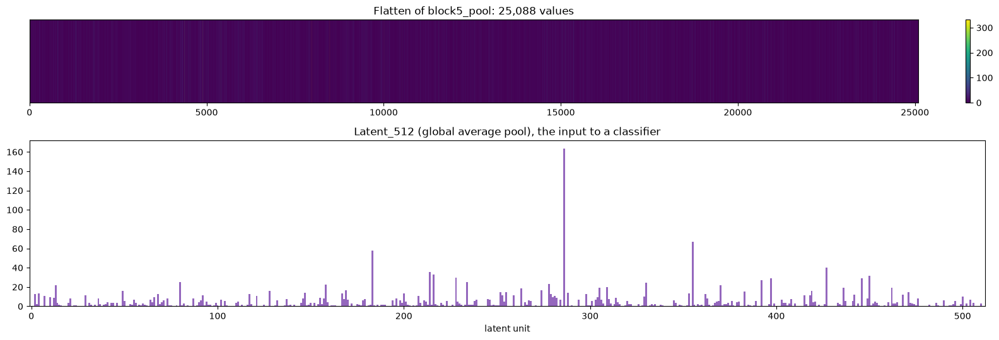

top-10 latent units: {286: 163.73, 355: 66.99, 183: 57.55, 427: 39.92, 214: 35.71, 216: 32.89, 450: 31.57, 228: 29.44, 397: 29.06, 446: 28.72}
non-zero units: 424/512


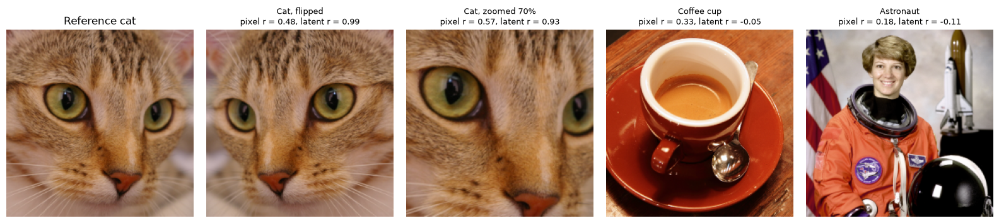

Image               pixel corr  latent corr
Cat, flipped             0.485        0.994
Cat, zoomed 70%          0.573        0.926
Coffee cup               0.326       -0.055
Astronaut                0.180       -0.107

Step 14 verified: Latent_512 = GAP(block5_pool), saved to outputs/cat_latent_512.csv


In [17]:
flat_rgb, latent_rgb = ract["Flatten"], ract["Latent_512"]

fig, axes = plt.subplots(2, 1, figsize=(16, 5.5), gridspec_kw={"height_ratios": [1, 2]})
im = axes[0].imshow(flat_rgb.reshape(1, -1), aspect="auto", cmap="viridis")
axes[0].set_title(f"Flatten of block5_pool: {flat_rgb.size:,} values"); axes[0].set_yticks([])
plt.colorbar(im, ax=axes[0], fraction=0.02)
axes[1].bar(np.arange(512), latent_rgb, width=1.0, color="tab:purple")
axes[1].set_title("Latent_512 (global average pool), the input to a classifier")
axes[1].set_xlabel("latent unit"); axes[1].set_xlim(-1, 512)
plt.tight_layout()
plt.show()

top10 = np.argsort(latent_rgb)[::-1][:10]
print("top-10 latent units:", {int(u): round(float(latent_rgb[u]), 2) for u in top10})
print(f"non-zero units: {np.count_nonzero(latent_rgb)}/512")
np.savetxt("outputs/cat_latent_512.csv", latent_rgb.reshape(1, -1), delimiter=",")

probes = {
    "Cat, flipped": cat[:, ::-1].copy(),
    "Cat, zoomed 70%": preprocess_rgb(cat_raw, zoom=0.7),
    "Coffee cup": preprocess_rgb(data.coffee()),
    "Astronaut": preprocess_rgb(data.astronaut()),
}
rows = []
for name, img in probes.items():
    pix = np.corrcoef(cat.ravel(), img.ravel())[0, 1]
    lat = np.corrcoef(latent_rgb, rgb_forward(to_vgg_tensor(img))["Latent_512"])[0, 1]
    rows.append((name, pix, lat))

fig, axes = plt.subplots(1, 5, figsize=(16, 3.4))
axes[0].imshow(cat); axes[0].set_title("Reference cat")
for ax, (name, pix, lat), img in zip(axes[1:], rows, probes.values()):
    ax.imshow(img); ax.set_title(f"{name}\npixel r = {pix:.2f}, latent r = {lat:.2f}", fontsize=9)
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

print(f"{'Image':<18}{'pixel corr':>12}{'latent corr':>13}")
for name, pix, lat in rows:
    print(f"{name:<18}{pix:>12.3f}{lat:>13.3f}")

# Verify: the latent is the spatial mean of block5_pool, and Flatten is its reshape.
assert np.allclose(latent_rgb, ract["block5_pool"].mean(axis=(0, 1)), atol=1e-4)
assert np.array_equal(flat_rgb, ract["block5_pool"].reshape(-1))
print("\nStep 14 verified: Latent_512 = GAP(block5_pool), saved to outputs/cat_latent_512.csv")

Observation

- 424 of the 512 latent units are non-zero, and unit 286 at 163.73 is more than twice the next largest, unit 355 at 66.99.
- The flipped cat correlates 0.485 with the original in pixels but 0.994 in the latent, and the zoomed cat goes from 0.573 to 0.926.
- The coffee cup correlates 0.326 in pixels but -0.055 in the latent, and the astronaut 0.180 against -0.107, so the latent groups images by content.

## Step 15: How the CNN extracts different levels of features

- One layer is taken from each block and labelled with the feature level it is known for, following Zeiler and Fergus (2014).
- The receptive field is the patch of input pixels one output value can see, and it grows by 2 px per conv and doubles its step at each pool.
- The left column overlays each layer's mean activation on the cat to show where that level is looking.

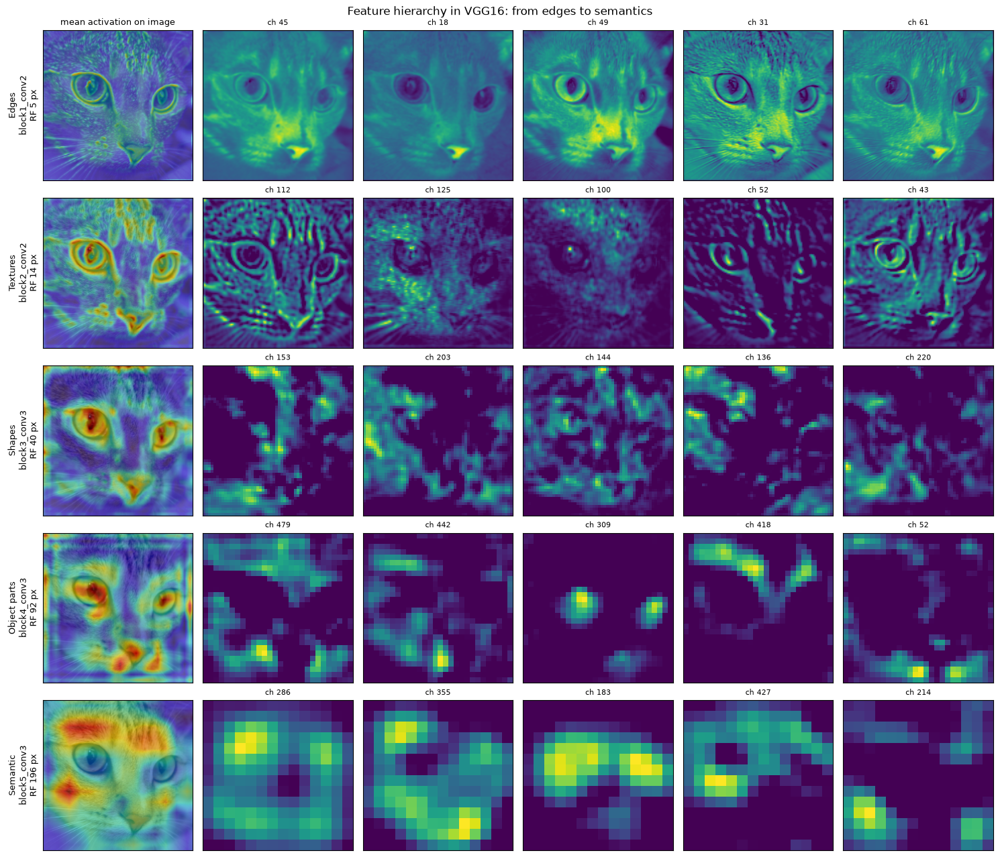

Level         Layer               Map  Channels  RF (px)  % active    Values
Edges         block1_conv2    224x224        64        5     67.2% 3,211,264
Textures      block2_conv2    112x112       128       14     48.3% 1,605,632
Shapes        block3_conv3      56x56       256       40     30.5%   802,816
Object parts  block4_conv3      28x28       512       92     14.8%   401,408
Semantic      block5_conv3      14x14       512      196     10.0%   100,352
Latent        Latent_512          1x1       512    whole     82.8%       512

Step 15 verified: receptive fields match the hand calculation


In [18]:
LEVELS = [("Edges", "block1_conv2"), ("Textures", "block2_conv2"), ("Shapes", "block3_conv3"),
          ("Object parts", "block4_conv3"), ("Semantic", "block5_conv3")]

rf, jump, RF = 1, 1, {}
for l in vgg.layers[1:]:
    if isinstance(l, L.Conv2D):
        rf += (l.kernel_size[0] - 1) * jump
    elif isinstance(l, L.MaxPooling2D):
        rf += (l.pool_size[0] - 1) * jump
        jump *= l.strides[0]
    RF[l.name] = rf

fig, axes = plt.subplots(len(LEVELS), 6, figsize=(15, 13))
for r, (level, n) in enumerate(LEVELS):
    fmap = ract[n]
    mean_map = transform.resize(fmap.mean(axis=2), (RGB_SIZE, RGB_SIZE))
    axes[r, 0].imshow(cat); axes[r, 0].imshow(mean_map, cmap="jet", alpha=0.5)
    axes[r, 0].set_ylabel(f"{level}\n{n}\nRF {RF[n]} px", fontsize=9)
    for c, ch in enumerate(top_channels(fmap, 5)):
        axes[r, c + 1].imshow(fmap[:, :, ch], cmap="viridis")
        axes[r, c + 1].set_title(f"ch {ch}", fontsize=8)
axes[0, 0].set_title("mean activation on image", fontsize=9)
for ax in axes.flat:
    ax.set_xticks([]); ax.set_yticks([])
plt.suptitle("Feature hierarchy in VGG16: from edges to semantics")
plt.tight_layout()
plt.show()

print(f"{'Level':<14}{'Layer':<14}{'Map':>9}{'Channels':>10}{'RF (px)':>9}{'% active':>10}{'Values':>10}")
for level, n in LEVELS:
    f = ract[n]
    print(f"{level:<14}{n:<14}{f'{f.shape[0]}x{f.shape[1]}':>9}{f.shape[2]:>10}{RF[n]:>9}"
          f"{np.mean(f > 0) * 100:>9.1f}%{f.size:>10,}")
print(f"{'Latent':<14}{'Latent_512':<14}{'1x1':>9}{512:>10}{'whole':>9}"
      f"{np.mean(latent_rgb > 0) * 100:>9.1f}%{512:>10,}")

# Verify: receptive field hand formula for block1_conv2 (3 + 2 = 5) and block5_pool (212).
assert RF["block1_conv2"] == 5 and RF["block5_pool"] == 212
print("\nStep 15 verified: receptive fields match the hand calculation")

Observation

- The receptive field grows 5, 14, 40, 92, 196 px, so a block5 unit sees almost the whole 224 px image.
- Active values fall from 67.2% to 10.0% across the five levels, so deeper features are rarer and more specific.
- The mean activation moves from fur and whisker edges in block 1, to eyes and nose in blocks 3 and 4, to broad face regions in block 5.

Inference

- Hand-written kernels were enough for edges, textures and blobs, but features that mean eye or cat only appeared in VGG16's learned deep layers.
- My NumPy convolution matched TensorFlow's built-in one in every test, within 4.86e-05, so a conv layer is just a sliding dot product plus bias and ReLU.
- A latent vector is only as useful as the weights behind it: the untrained X-ray CNN kept ultrasound apart from X-ray (0.690 to 0.782 cosine) but not pneumonia from normal (0.915), while pretrained VGG16 kept a flipped cat at 0.994 correlation and a coffee cup at -0.055.